In [1]:
using CSV, DataFrames, Dates, PDMats, SpecialFunctions, Distributions, Extremes, IDFCurves, QuantileMatching, ExtendedExtremes, Gadfly, Cairo, Test, LinearAlgebra, MambaLite, Random, Statistics

In [2]:
idf_mtl_trudeau = CSV.read("C:\\Users\\CM\\Polytechnique\\IDFCurves.jl\\data\\702S006-2.csv", DataFrame)

# Define the durations and return periods
durations = [1/12, 1/6, 1/4, 1/2, 1, 2, 6, 12, 24]
str_durations = ["5min", "10min", "15min", "30min", "1h", "2h", "6h", "12h", "24h"]
return_periods = [2, 5, 10, 25, 50, 100]

# Initialize an empty DataFrame for storing results
results_df = DataFrame(T = Float64[], d = Float64[], return_level = Float64[])

# Loop through each duration and calculate return levels
for (duration, str_duration) in zip(durations, str_durations)
    fm = Extremes.gevfit(idf_mtl_trudeau, Symbol(str_duration))
    for T in return_periods
        return_level = Extremes.returnlevel(fm, T).value[1]
        push!(results_df, [T, duration, return_level])
    end
end

new_layer = layer(results_df, x=:d, y=:return_level, color = :T, shape=[Shape.xcross], Geom.point())


1-element Vector{Layer}:
 Layer(54×3 DataFrame
 Row │ T        d           return_level 
     │ Float64  Float64     Float64      
─────┼───────────────────────────────────
   1 │     2.0   0.0833333      97.9701
   2 │     5.0   0.0833333     126.192
   3 │    10.0   0.0833333     143.94
   4 │    25.0   0.0833333     165.351
   5 │    50.0   0.0833333     180.535
   6 │   100.0   0.0833333     195.041
   7 │     2.0   0.166667       69.8667
   8 │     5.0   0.166667       89.7926
  ⋮  │    ⋮         ⋮            ⋮
  48 │   100.0  12.0             8.15552
  49 │     2.0  24.0             1.97639
  50 │     5.0  24.0             2.53597
  51 │    10.0  24.0             2.95746
  52 │    25.0  24.0             3.55613
  53 │    50.0  24.0             4.0535
  54 │   100.0  24.0             4.59714
                          39 rows omitted, Dict{Symbol, Any}(:color => :T, :x => :d, :y => :return_level, :shape => [Gadfly.Shape.xcross]), Gadfly.StatisticElement[], Gadfly.Geom.PointGeometry

DependentScalingModel{SimpleScaling{Float64}, UncorrelatedStructure, IdentityCopula}(SimpleScaling{Float64}(d₀ = 1.0, μ₀ = 18.2106, σ₀ = 5.3074, ξ = 0.0542, α = 0.6921)
, UncorrelatedStructure())


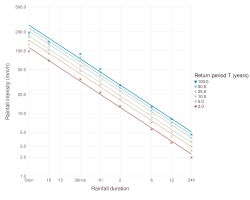

In [36]:
set_default_plot_size(25cm, 20cm)

idf_mtl_trudeau = CSV.read("C:\\Users\\CM\\Polytechnique\\IDFCurves.jl\\data\\702S006-2.csv", DataFrame)
idf_mtl_trudeau = idf_mtl_trudeau[idf_mtl_trudeau.Year .>= 1955, :]
first(idf_mtl_trudeau, 5)

durations = [1/12, 1/6, 1/4, 1/2, 1, 2, 6, 12, 24]
tags = names(idf_mtl_trudeau)[2:10]
duration_dict = Dict(zip(tags, durations))
data = IDFdata(idf_mtl_trudeau, "Year", duration_dict)

pd = DependentScalingModel{SimpleScaling, UncorrelatedStructure, IdentityCopula}
f_dist = IDFCurves.fit_mle(pd, data, 1,  [20, 5, .04, 0.7])

println(f_dist)

idf = plotIDFCurves(
    f_dist, 
    data, 
    show_confidence_intervals=true, 
    ribbon=true, 
    dgev_return_levels=true, 
    T_values=[2,5,10,25,50,100], 
    y_ticks=log.([1, 2, 3, 5, 10, 20, 50, 100, 200 , 500]),
    additional_layers=new_layer
)


Stacktrace:
  [1] initial_state(method::Optim.IPNewton{typeof(Optim.backtrack_constrained_grad), Symbol}, options::Optim.Options{Float64, Nothing}, d::NLSolversBase.TwiceDifferentiable{Float64, Vector{Float64}, Matrix{Float64}, Vector{Float64}}, constraints::NLSolversBase.TwiceDifferentiableConstraints{Optim.var"#116#119", Optim.var"#117#120", Optim.var"#118#121", Float64}, initial_x::Vector{Float64})
    @ Optim C:\Users\CM\.julia\packages\Optim\ZhuZN\src\multivariate\solvers\constrained\ipnewton\ipnewton.jl:117
  [2] optimize(d::NLSolversBase.TwiceDifferentiable{Float64, Vector{Float64}, Matrix{Float64}, Vector{Float64}}, lower::Vector{Float64}, upper::Vector{Float64}, initial_x::Vector{Float64}, method::Optim.IPNewton{typeof(Optim.backtrack_constrained_grad), Symbol}, options::Optim.Options{Float64, Nothing})
    @ Optim C:\Users\CM\.julia\packages\Optim\ZhuZN\src\multivariate\solvers\constrained\ipnewton\interior.jl:211
  [3] optimize
    @ C:\Users\CM\.julia\packages\Optim\ZhuZN\

DependentScalingModel{GeneralScaling{Float64, Float64}, UncorrelatedStructure, IdentityCopula}(GeneralScaling{Float64, Float64}(d₀ = 1.0, μ₀ = 19.9773, σ₀ = 5.2523, ξ = 0.0454, α = 0.7589, δ = 0.0712)
, UncorrelatedStructure())


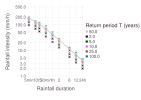

In [4]:
idf_mtl_trudeau = CSV.read("C:\\Users\\CM\\Polytechnique\\IDFCurves.jl\\data\\702S006-2.csv", DataFrame)
idf_mtl_trudeau = idf_mtl_trudeau[idf_mtl_trudeau.Year .>= 1955, :]
first(idf_mtl_trudeau, 5)

durations = [1/12, 1/6, 1/4, 1/2, 1, 2, 6, 12, 24]
tags = names(idf_mtl_trudeau)[2:10]
duration_dict = Dict(zip(tags, durations))
data = IDFdata(idf_mtl_trudeau, "Year", duration_dict)

pd = DependentScalingModel{GeneralScaling, UncorrelatedStructure, IdentityCopula}
f_dist = IDFCurves.fit_mle(pd, data, 1,  [20, 5, .04, .76, 0.07])

println(f_dist)

idf = plotIDFCurves(
    f_dist, 
    data, 
    show_confidence_intervals=true, 
    ribbon=true, 
    dgev_return_levels=true, 
    T_values=[50], 
    y_ticks=log.([1, 2, 3, 5, 10, 20, 50, 100, 200 , 500]),
    additional_layers=new_layer
)

DependentScalingModel{TotalScaling{Real, Real}, UncorrelatedStructure, IdentityCopula}(TotalScaling{Real, Real}(d₀ = 1, μ₀ = 20.0759, σ₀ = 5.5889, ξ = 0.0789, α₁ = 0.8063, α₂ = 0.0357, δ = 0.0824, τ = 0.0)
, UncorrelatedStructure())


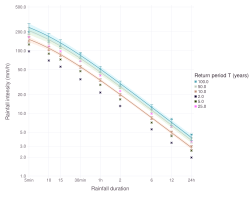

In [11]:
idf_mtl_trudeau = CSV.read("C:\\Users\\CM\\Polytechnique\\IDFCurves.jl\\data\\702S006-2.csv", DataFrame)
idf_mtl_trudeau = idf_mtl_trudeau[idf_mtl_trudeau.Year .>= 1955, :]
first(idf_mtl_trudeau, 5)

durations = [1/12, 1/6, 1/4, 1/2, 1, 2, 6, 12, 24]
tags = names(idf_mtl_trudeau)[2:10]
duration_dict = Dict(zip(tags, durations))
data = IDFdata(idf_mtl_trudeau, "Year", duration_dict)

pd = TotalScaling(1.0, 20, 5, 0, .76, .09, 0.01, 1)
Σ = UncorrelatedStructure()
C = IdentityCopula
dsm = DependentScalingModel(pd, Σ, C) 

f_dist = IDFCurves.fit_mle(dsm, data, 1,  [20, 5, 0.01, .76, .01, 1.08, 1], [nothing, nothing, nothing, nothing, nothing, nothing, 0])

println(f_dist)

set_default_plot_size(25cm, 20cm)

idf = plotIDFCurves(
    f_dist, 
    data, 
    show_confidence_intervals=true, 
    ribbon=true, 
    dgev_return_levels=true, 
    T_values=[10,50,100], 
    y_ticks=log.([1, 2, 3, 5, 10, 20, 50, 100, 200, 500]),
    additional_layers=new_layer
)

# p_24h = IDFCurves.qqplot_std_data(f_dist, data, [1/12])

In [12]:
# CLIMEX, composé de 50 membres, mais spécifiquemenet au point latitude, longitude Montreal.
"""
    annualmax(durations::Vector{<:Real}, all::Bool = true, writeOut::Bool = false)

    Annual maximum of array data.
    Hourly time series. Extract the highest value for year i.
"""
function annualmax(durations::Vector{<:Real}, all::Bool = true, writeOut::Bool = false)
    folder_path = "data/climEx_hrs"
    csv_dict = Dict{String, DataFrame}()
    csv_files = filter(x -> occursin(".csv", x), readdir(folder_path))

    for file in csv_files
        # Initialize an empty DataFrame for storing results
        final_df = DataFrame()

        for duration in durations
            file_path = joinpath(folder_path, file)
            climex_df = CSV.read(file_path, DataFrame)

            df_daily_agg = combine(groupby(transform(climex_df, :Date => ByRow(x -> x - Dates.Hour(hour(x) % duration)) => :Grouped_Period, renamecols=false),  :Grouped_Period), :Pluie=>sum=>:Pluie)
            df_daily_agg = transform(df_daily_agg, :Grouped_Period => ByRow(x -> Dates.year(x)) => :Year, :Grouped_Period => ByRow(x -> Dates.month(x)) => :Month, copycols=false)
            numYears = unique(df_daily_agg[!,:Year])

            # Filter for months May (5) to October (10)
            df_daily_agg = filter(row -> row.Month >= 5 && row.Month <= 10, df_daily_agg)

            annual_maxima = zeros(length(numYears))
            for i in 1:(length(numYears))
                idx = searchsortedfirst(df_daily_agg[!,:Year], numYears[i]):searchsortedlast(df_daily_agg[!,:Year], numYears[i])
                annual_maxima[i] = Statistics.maximum(df_daily_agg[idx,:Pluie])
            end

            maxima_col = string("Maxima $(duration)h")
            df_annual_maxima = DataFrame(Year = numYears, Maxima = annual_maxima)
            df_annual_maxima = rename(df_annual_maxima, :Maxima => maxima_col)
            df_annual_maxima[!, maxima_col] = Float64.(df_annual_maxima[!, maxima_col]) ./ duration

            if writeOut
                CSV.write(string("$(duration)h.csv"), df_annual_maxima)
            end

            # Combine with final DataFrame
            if ncol(final_df) == 0
                final_df = df_annual_maxima
            else
                final_df = outerjoin(final_df, df_annual_maxima, on=:Year, makeunique=true)
            end
            clean_df = dropmissing(final_df)
            csv_dict[file] = clean_df

        end

        if !all
            break
        end
    end

    return csv_dict
end 

df_annual_maxima = annualmax([1,2,6,12,24,36,48,60,72, 96, 120], false)

Dict{String, DataFrame} with 1 entry:
  "kda.csv" => 145×12 DataFrame…

In [13]:
member_data = df_annual_maxima["kda.csv"]

Row,Year,Maxima 1h,Maxima 2h,Maxima 6h,Maxima 12h,Maxima 24h,Maxima 36h,Maxima 48h,Maxima 60h,Maxima 72h,Maxima 96h,Maxima 120h
,Int64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64
1,1955,14.214,10.1337,4.29223,2.18136,1.32693,0.884617,0.663463,0.53077,0.442308,0.331731,0.265385
2,1956,15.17,9.3672,4.10434,2.14255,1.75852,1.17235,0.879262,0.703409,0.586174,0.439631,0.351705
3,1957,64.6999,47.1591,17.1832,8.59173,4.29587,2.86391,2.14793,1.71835,1.43196,1.07397,0.859173
4,1958,40.7226,27.7022,9.53986,4.77297,2.43328,1.62219,1.21664,0.973314,0.811095,0.608321,0.486657
5,1959,21.1702,11.2942,4.24236,3.7224,2.34809,1.56539,1.17404,0.939234,0.782695,0.587021,0.469617
6,1960,19.8433,15.9374,7.06427,3.54471,1.79628,1.19752,0.898138,0.718511,0.598759,0.449069,0.359255
7,1961,26.574,17.351,5.98105,3.52962,1.76481,1.17654,0.882405,0.705924,0.58827,0.441202,0.352962
8,1962,30.3827,15.1914,6.78306,3.7516,2.04078,1.36052,1.02039,0.816314,0.680261,0.510196,0.408157
9,1963,13.5234,11.5247,5.91036,4.73592,2.36799,1.57866,1.184,0.947197,0.789331,0.591998,0.473598


In [14]:
rcp_data = CSV.read("C:\\Users\\CM\\Polytechnique\\IDFCurves.jl\\data\\RCPdata.csv", DataFrame)
rcp_data[!,"Cumulative RCP85"] = accumulate(+, rcp_data[!,"RCP85"])
rcp_data = rcp_data[2099 .>= rcp_data.Year .>= 1955, :]

# Define the durations and return periods
durations = [1, 2, 6, 12, 24]
str_durations = ["Maxima 1h", "Maxima 2h", "Maxima 6h", "Maxima 12h", "Maxima 24h"]
return_periods = [2, 5, 10, 25, 50, 100]

# Initialize an empty DataFrame for storing results
results_df = DataFrame(T = Float64[], d = Float64[], return_level = Float64[])

# Loop through each duration and calculate return levels
for (duration, str_duration) in zip(durations, str_durations)
    fm = Extremes.gevfit(member_data, Symbol(str_duration))
    for T in return_periods
        return_level = Extremes.returnlevel(fm, T).value[1]
        push!(results_df, [T, duration, return_level])
    end
end

new_layer = layer(results_df, x=:d, y=:return_level, color = :T, shape=[Shape.xcross], Geom.point())


1-element Vector{Layer}:
 Layer(30×3 DataFrame
 Row │ T        d        return_level 
     │ Float64  Float64  Float64      
─────┼────────────────────────────────
   1 │     2.0      1.0      21.396
   2 │     5.0      1.0      30.56
   3 │    10.0      1.0      37.7822
   4 │    25.0      1.0      48.4753
   5 │    50.0      1.0      57.7204
   6 │   100.0      1.0      68.1755
   7 │     2.0      2.0      14.2805
   8 │     5.0      2.0      20.289
  ⋮  │    ⋮        ⋮          ⋮
  24 │   100.0     12.0       8.94922
  25 │     2.0     24.0       2.12942
  26 │     5.0     24.0       2.83865
  27 │    10.0     24.0       3.3187
  28 │    25.0     24.0       3.93746
  29 │    50.0     24.0       4.40546
  30 │   100.0     24.0       4.87771
                       15 rows omitted, Dict{Symbol, Any}(:color => :T, :x => :d, :y => :return_level, :shape => [Gadfly.Shape.xcross]), Gadfly.StatisticElement[], Gadfly.Geom.PointGeometry(Symbol("")), nothing, 0)

DependentScalingModel{TotalScaling{Real, Real}, UncorrelatedStructure, IdentityCopula}(TotalScaling{Real, Real}(d₀ = 1, μ₀ = 19.1181, σ₀ = 7.1249, ξ = 0.1, α₁ = 0.8614, α₂ = 0.0268, δ = 0.523, τ = 0.0)
, UncorrelatedStructure())


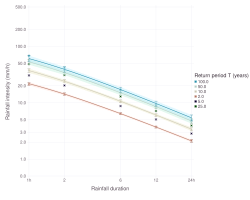

In [15]:
member_data = df_annual_maxima["kda.csv"]
durations = [1, 2, 6, 12, 24]
tags = names(member_data)[2:6]
duration_dict = Dict(zip(tags, durations))

member_data = member_data[member_data.Year .>= 1955, :]
climex_data = IDFdata(member_data, "Year", duration_dict)

pd = TotalScaling(1.0, 20, 5, 0, .76, 0.76, 0.01, 1)
Σ = UncorrelatedStructure()
C = IdentityCopula
dsm = DependentScalingModel(pd, Σ, C) 
f_dist = IDFCurves.fit_mle(dsm, climex_data, 1,  [20, 5, 0, .76, 0.76, .09, 1], [nothing, nothing, nothing, nothing, nothing, nothing, 0])

println(f_dist)

set_default_plot_size(25cm, 20cm)

idf = plotIDFCurves(
    f_dist, 
    climex_data, 
    show_confidence_intervals=true, 
    ribbon=true, 
    dgev_return_levels=true, 
    T_values=[2,10,50,100], 
    durations=[1, 2, 6, 12, 24],
    y_ticks=log.([0.5, 1, 2, 3, 5, 10, 20, 50, 100, 200, 500]),
    additional_layers=new_layer
)

In [41]:
set_default_plot_size(20cm, 20cm)

member_data = df_annual_maxima["kda.csv"]
durations = [1, 2, 6, 12, 24]
tags = names(member_data)[2:6]
duration_dict = Dict(zip(tags, durations))
climex_member_data = member_data[2021 .>= member_data.Year .>= 1955, :]
climex_data_1995_2021 = IDFdata(climex_member_data, "Year", duration_dict)

rcp_full_data_1955_2021 = rcp_data[rcp_data.Year .<= 2021, :]
rcp_data_1955_2021 = rcp_full_data_1955_2021[rcp_full_data_1955_2021.Year .!= 1994, :]
rcp_data_1955_2021 = rcp_data_1955_2021[rcp_data_1955_2021.Year .!= 1995, :]
rcp_data_1955_2021 = rcp_data_1955_2021[rcp_data_1955_2021.Year .!= 2003, :]

general_pd = GeneralScaling(
    1.0,
    Covariates([Covariate("t", rcp_full_data_1955_2021[:, Symbol("Year")])], LinearParamComputation),
    Covariates(),
    Covariates(),
    Covariates(),
    Covariates()
)
Σ = UncorrelatedStructure()
C = IdentityCopula

general_dsm = DependentScalingModel(general_pd, Σ, C) 
general_fd = IDFCurves.fit_mle(general_dsm, climex_data_1995_2021, 1, [23, 1, 5.0, -.025, .835, .001], [nothing, nothing, nothing, nothing, nothing, log(delta)])

println(general_fd)

member_data = df_annual_maxima["kda.csv"]
durations = [1, 2, 6, 12, 24]
tags = names(member_data)[2:6]
duration_dict = Dict(zip(tags, durations))
climex_member_data = member_data[member_data.Year .>= 1955, :]
climex_data_full = IDFdata(climex_member_data, "Year", duration_dict)

general_pd = GeneralScaling(
    1.0,
    Covariates([Covariate("t", rcp_data[:, Symbol("Year")])], LinearParamComputation),
    Covariates(),
    Covariates(),
    Covariates(),
    Covariates()
)
Σ = UncorrelatedStructure()
C = IdentityCopula
general_dsm = DependentScalingModel(general_pd, Σ, C) 
general_fd = IDFCurves.fit_mle(general_dsm, climex_data_full, 1,  [20, 1, 5, .04, .76, .07], [nothing, nothing, nothing, nothing, nothing, log(delta)])

println(general_fd)

LinearParamComputation
LinearParamComputation
LinearParamComputation
LinearParamComputation
LinearParamComputation
DependentScalingModel{GeneralScaling{Real, IDFCurves.paramfun}, UncorrelatedStructure, IdentityCopula}(GeneralScaling{Real, IDFCurves.paramfun}(d₀ = 1, μ₀ = [17.9179, -0.2978], σ₀ = [5.5477], ξ = [0.0867], α = [0.7315], δ = [0.0826])
, UncorrelatedStructure())
LinearParamComputation
LinearParamComputation
LinearParamComputation
LinearParamComputation
LinearParamComputation
DependentScalingModel{GeneralScaling{Real, IDFCurves.paramfun}, UncorrelatedStructure, IdentityCopula}(GeneralScaling{Real, IDFCurves.paramfun}(d₀ = 1, μ₀ = [20.035, 0.712], σ₀ = [6.9661], ξ = [0.0903], α = [0.7511], δ = [0.0826])
, UncorrelatedStructure())


NonDimLinearParamComputation
LinearParamComputation
LinearParamComputation
LinearParamComputation
LinearParamComputation
DependentScalingModel{GeneralScaling{Real, IDFCurves.paramfun}, UncorrelatedStructure, IdentityCopula}(GeneralScaling{Real, IDFCurves.paramfun}(d₀ = 1, μ₀ = [17.9227, -0.0196], σ₀ = [5.5442], ξ = [0.0868], α = [0.7316], δ = [0.0826])
, UncorrelatedStructure())
5.6373633721156375
0.04440221159231569
0.7707888048093178
0.08259411257260287
NonDimLinearParamComputation
LinearParamComputation
LinearParamComputation
LinearParamComputation
LinearParamComputation
DependentScalingModel{GeneralScaling{Real, IDFCurves.paramfun}, UncorrelatedStructure, IdentityCopula}(GeneralScaling{Real, IDFCurves.paramfun}(d₀ = 1, μ₀ = [20.1742, -0.0196], σ₀ = [5.6374], ξ = [0.0444], α = [0.7708], δ = [0.0826])
, UncorrelatedStructure())


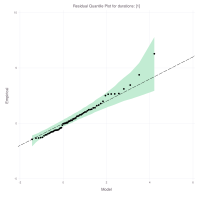

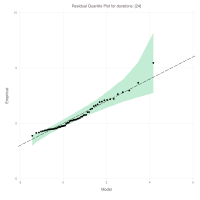

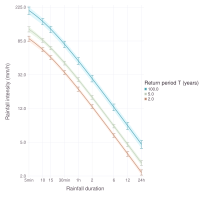

┌ Warning: The following aesthetics are mapped, but not used by any geometry:
│ shape
└ @ Gadfly C:\Users\CM\.julia\packages\Gadfly\OQ068\src\Gadfly.jl:503
┌ Warning: The following aesthetics are mapped, but not used by any geometry:
│ shape
└ @ Gadfly C:\Users\CM\.julia\packages\Gadfly\OQ068\src\Gadfly.jl:503


In [40]:
set_default_plot_size(20cm, 20cm)

member_data = df_annual_maxima["kda.csv"]
durations = [1, 2, 6, 12, 24]
tags = names(member_data)[2:6]
duration_dict = Dict(zip(tags, durations))
climex_member_data = member_data[2021 .>= member_data.Year .>= 1955, :]
climex_data_1995_2021 = IDFdata(climex_member_data, "Year", duration_dict)

rcp_full_data_1955_2021 = rcp_data[rcp_data.Year .<= 2021, :]
rcp_data_1955_2021 = rcp_full_data_1955_2021[rcp_full_data_1955_2021.Year .!= 1994, :]
rcp_data_1955_2021 = rcp_data_1955_2021[rcp_data_1955_2021.Year .!= 1995, :]
rcp_data_1955_2021 = rcp_data_1955_2021[rcp_data_1955_2021.Year .!= 2003, :]

general_pd = GeneralScaling(
    1.0,
    Covariates([Covariate("t", rcp_full_data_1955_2021[:, Symbol("RCP85")])], NonDimLinearParamComputation),
    Covariates(),
    Covariates(),
    Covariates(),
    Covariates()
)
Σ = UncorrelatedStructure()
C = IdentityCopula

general_dsm = DependentScalingModel(general_pd, Σ, C) 
general_fd = IDFCurves.fit_mle(general_dsm, climex_data_1995_2021, 1, [23, 1, 5.0, -.025, .835, .001], [nothing, nothing, nothing, nothing, nothing, log(delta)])

println(general_fd)

p_24h = IDFCurves.qqplot_std_data(general_fd, climex_data_1995_2021, [1])

display(p_24h)

loc = getmarginalmodel(general_fd).μ₀.estimators[1]
loc_cov = getmarginalmodel(general_fd).μ₀.estimators[2]

println(obs_sigma)
println(obs_shape)
println(obs_alpha)
println(delta)

obs_general_pd = GeneralScaling(
    1.0,
    Covariates([Covariate("t", rcp_data_1955_2021[:, Symbol("RCP85")])], NonDimLinearParamComputation),
    Covariates(),
    Covariates(),
    Covariates(),
    Covariates()
)
Σ = UncorrelatedStructure()
C = IdentityCopula
obs_general_dsm = DependentScalingModel(obs_general_pd, Σ, C) 
obs_general_fd = IDFCurves.fit_mle(obs_general_dsm, data, 1,  [20, 1, 5, .04, .76, .07], [obs_mu, loc_cov, log(obs_sigma), obs_shape, IDFCurves.logit(obs_alpha), log(delta)])

println(obs_general_fd)

p_24h = IDFCurves.qqplot_std_data(obs_general_fd, data, [24])

display(p_24h)

idf = plotIDFCurves(obs_general_fd, data, show_confidence_intervals=true, ribbon=true, dgev_return_levels=true, T_values=[2,5,100], year=64)

display(idf)

In [64]:
general_pd = GeneralScaling(
    1.0,
    Covariates([Covariate("t", rcp_data[:, Symbol("RCP85")])], NonDimLinearParamComputation),
    Covariates(),
    Covariates(),
    Covariates(),
    Covariates()
)
Σ = UncorrelatedStructure()
C = IdentityCopula

general_dsm = DependentScalingModel(general_pd, Σ, C) 
general_fd = IDFCurves.fit_mle(general_dsm, climex_data, 1, [23, 1, 5.0, -.025, .835, .001], [nothing, nothing, nothing, nothing, nothing, log(delta)])

println(general_fd)

p_24h = IDFCurves.qqplot_std_data(general_fd, climex_data, [1])

display(p_24h)

loc = getmarginalmodel(general_fd).μ₀.estimators[1]
loc_cov = getmarginalmodel(general_fd).μ₀.estimators[2]

rcp_data_1955_2021 = rcp_data[rcp_data.Year .<= 2021, :]
rcp_data_1955_2021 = rcp_data_1955_2021[rcp_data_1955_2021.Year .!= 1994, :]
rcp_data_1955_2021 = rcp_data_1955_2021[rcp_data_1955_2021.Year .!= 1995, :]
rcp_data_1955_2021 = rcp_data_1955_2021[rcp_data_1955_2021.Year .!= 2003, :]

println(obs_sigma)
println(obs_shape)
println(obs_alpha)
println(delta)

obs_general_pd = GeneralScaling(
    1.0,
    Covariates([Covariate("t", rcp_data_1955_2021[:, Symbol("RCP85")])], NonDimLinearParamComputation),
    Covariates(),
    Covariates(),
    Covariates(),
    Covariates()
)
Σ = UncorrelatedStructure()
C = IdentityCopula
obs_general_dsm = DependentScalingModel(obs_general_pd, Σ, C) 
obs_general_fd = IDFCurves.fit_mle(obs_general_dsm, data, 1,  [20, 1, 5, .04, .76, .07], [loc, loc_cov, log(obs_sigma), obs_shape, IDFCurves.logit(obs_alpha), log(delta)])

p_24h = IDFCurves.qqplot_std_data(obs_general_fd, data, [24])

display(p_24h)

idf = plotIDFCurves(obs_general_fd, data, show_confidence_intervals=true, ribbon=true, dgev_return_levels=true, T_values=[2,5,100], year=64)

set_default_plot_size(20cm, 20cm)
display(idf)

UndefVarError: UndefVarError: `rcp_data` not defined

NonDimExpoParamComputation
LinearParamComputation
LinearParamComputation
LinearParamComputation
LinearParamComputation
DependentScalingModel{GeneralScaling{Real, IDFCurves.paramfun}, UncorrelatedStructure, IdentityCopula}(GeneralScaling{Real, IDFCurves.paramfun}(d₀ = 1, μ₀ = [20.0381, 0.0368], σ₀ = [6.9739], ξ = [0.088], α = [0.7512], δ = [0.0826])
, UncorrelatedStructure())
5.6373633721156375
0.04440221159231569
0.7707888048093178
0.08259411257260287
NonDimExpoParamComputation
LinearParamComputation
LinearParamComputation
LinearParamComputation
LinearParamComputation


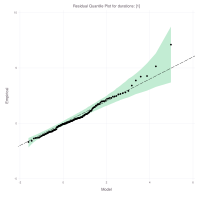

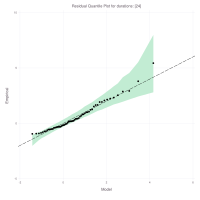

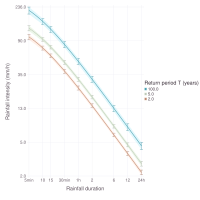

┌ Warning: The following aesthetics are mapped, but not used by any geometry:
│ shape
└ @ Gadfly C:\Users\CM\.julia\packages\Gadfly\OQ068\src\Gadfly.jl:503
┌ Warning: The following aesthetics are mapped, but not used by any geometry:
│ shape
└ @ Gadfly C:\Users\CM\.julia\packages\Gadfly\OQ068\src\Gadfly.jl:503


In [10]:
general_pd = GeneralScaling(
    1.0,
    Covariates([Covariate("t", rcp_data[:, Symbol("RCP85")])], NonDimExpoParamComputation),
    Covariates(),
    Covariates(),
    Covariates(),
    Covariates()
)
Σ = UncorrelatedStructure()
C = IdentityCopula

general_dsm = DependentScalingModel(general_pd, Σ, C) 
general_fd = IDFCurves.fit_mle(general_dsm, climex_data, 1, [23, 1, 5.0, -.025, .835, .001], [nothing, nothing, nothing, nothing, nothing, log(delta)])

println(general_fd)

p_24h = IDFCurves.qqplot_std_data(general_fd, climex_data, [1])

display(p_24h)

loc = getmarginalmodel(general_fd).μ₀.estimators[1]
loc_cov = getmarginalmodel(general_fd).μ₀.estimators[2]

rcp_data_1955_2021 = rcp_data[rcp_data.Year .<= 2021, :]
rcp_data_1955_2021 = rcp_data_1955_2021[rcp_data_1955_2021.Year .!= 1994, :]
rcp_data_1955_2021 = rcp_data_1955_2021[rcp_data_1955_2021.Year .!= 1995, :]
rcp_data_1955_2021 = rcp_data_1955_2021[rcp_data_1955_2021.Year .!= 2003, :]

println(obs_sigma)
println(obs_shape)
println(obs_alpha)
println(delta)

obs_general_pd = GeneralScaling(
    1.0,
    Covariates([Covariate("t", rcp_data_1955_2021[:, Symbol("RCP85")])], NonDimExpoParamComputation),
    Covariates(),
    Covariates(),
    Covariates(),
    Covariates()
)
Σ = UncorrelatedStructure()
C = IdentityCopula
obs_general_dsm = DependentScalingModel(obs_general_pd, Σ, C) 
obs_general_fd = IDFCurves.fit_mle(obs_general_dsm, data, 1,  [20, 1, 5, .04, .76, .07], [loc, loc_cov, log(obs_sigma), obs_shape, IDFCurves.logit(obs_alpha), log(delta)])

p_24h = IDFCurves.qqplot_std_data(obs_general_fd, data, [24])

display(p_24h)

idf = plotIDFCurves(obs_general_fd, data, show_confidence_intervals=true, ribbon=true, dgev_return_levels=true, T_values=[2,5,100], year=64)

set_default_plot_size(20cm, 20cm)
display(idf)

DependentScalingModel{GeneralScaling{Real, IDFCurves.paramfun}, MaternCorrelationStructure{Float64}, GaussianCopula}(GeneralScaling{Real, IDFCurves.paramfun}(d₀ = 1, μ₀ = [20.0512, 0.7455], σ₀ = [6.9737], ξ = [0.0881], α = [0.7512], δ = [0.0826])
, MaternCorrelationStructure{Float64}(5.039029521560708e-17, 17139.693495703992))

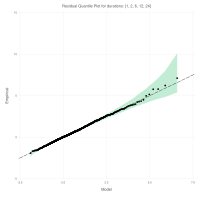

In [18]:
general_pd = GeneralScaling(
    1.0,
    Covariates([Covariate("t", rcp_data[:, Symbol("RCP85")])], LinearParamComputation()),
    Covariates(),
    Covariates(),
    Covariates(),
    Covariates()
)
Σ = MaternCorrelationStructure(1.0, 1.0)
C = GaussianCopula

general_dsm = DependentScalingModel(general_pd, Σ, C) 
general_fd = IDFCurves.fit_mle(general_dsm, climex_data, 1, [24.98, 1., 1., -0.005, .835, .001, 1.0, 1.0], [nothing, nothing, nothing, nothing, nothing, log(delta), nothing, nothing])

print(general_fd)

p_24h = IDFCurves.qqplot_std_data(general_fd, climex_data, [1, 2, 6, 12, 24])

In [19]:
set_default_plot_size(20cm, 18cm)
pd = HybridScaling(
    6.0,
    Covariates([Covariate("t", rcp_data[:, Symbol("RCP85")])], LinearParamComputation()),
    Covariates(),
    Covariates(),
    Covariates(),
    Covariates()
)
Σ = UncorrelatedStructure()
C = IdentityCopula

dsm = DependentScalingModel(pd, Σ, C) 
gaussian_fd = IDFCurves.fit_mle(dsm, climex_data, 6, [23, 1, 5.0, -.025, .5, 0.01], [nothing, nothing, nothing, nothing, nothing, nothing])

print(gaussian_fd)

p_24h = IDFCurves.qqplot_std_data(gaussian_fd, climex_data, [24])

MethodError: MethodError: no method matching length(::Covariates)

Closest candidates are:
  length(!Matched::Plots.PlotText)
   @ Plots C:\Users\CM\.julia\packages\Plots\HyyIK\src\components.jl:378
  length(!Matched::Hexagons.HexagonVertexIterator)
   @ Hexagons C:\Users\CM\.julia\packages\Hexagons\qn1vZ\src\Hexagons.jl:197
  length(!Matched::StatsBase.CoefTable)
   @ StatsBase C:\Users\CM\.julia\packages\StatsBase\XgjIN\src\statmodels.jl:31
  ...


In [20]:
pd_composite = CompositeScaling(
    1.0,
    Covariates([Covariate("t", rcp_data[:, Symbol("RCP85")])], LinearParamComputation()),
    Covariates(),
    Covariates(),
    Covariates(),
    Covariates()
)
Σ = UncorrelatedStructure()
C = IdentityCopula

dsm_composite = DependentScalingModel(pd_composite, Σ, C) 
composite_fd = IDFCurves.fit_mle(dsm_composite, climex_data, 1, [23, 1, 5.0, -.025, .835, .55], [nothing, nothing, nothing, nothing, nothing, nothing])

print(composite_fd)
IDFCurves.bic(composite_fd, climex_data)

p_24h = IDFCurves.qqplot_std_data(composite_fd, climex_data, [24])

MethodError: MethodError: no method matching length(::Covariates)

Closest candidates are:
  length(!Matched::Plots.PlotText)
   @ Plots C:\Users\CM\.julia\packages\Plots\HyyIK\src\components.jl:378
  length(!Matched::Hexagons.HexagonVertexIterator)
   @ Hexagons C:\Users\CM\.julia\packages\Hexagons\qn1vZ\src\Hexagons.jl:197
  length(!Matched::StatsBase.CoefTable)
   @ StatsBase C:\Users\CM\.julia\packages\StatsBase\XgjIN\src\statmodels.jl:31
  ...


In [21]:
using Distributions

function compare_models(log_likelihood_1, log_likelihood_2, df_1, df_2)
    """
    Compare two models based on their log-likelihoods.

    Parameters:
    - log_likelihood_1: Log-likelihood of the simpler model (Model 1)
    - log_likelihood_2: Log-likelihood of the more complex model (Model 2)
    - df_1: Number of parameters in Model 1
    - df_2: Number of parameters in Model 2

    Returns:
    - p_value: p-value from the chi-squared test
    - delta_deviance: Difference in deviance between the two models
    """
    # Calculate the difference in log-likelihoods
    delta_ll = log_likelihood_2 - log_likelihood_1

    # Calculate the difference in deviance
    delta_deviance = 2 * delta_ll

    # Degrees of freedom difference
    delta_df = df_2 - df_1
    
    # Calculate the p-value from the chi-squared distribution
    p_value = 1 - cdf(Chisq(delta_df), delta_deviance)

    return p_value, delta_deviance
end

compare_models (generic function with 1 method)

In [ ]:
set_default_plot_size(35cm, 50cm)
for (member_id, member_data) in df_annual_maxima
    durations = [1, 2, 6, 12, 24]
    tags = names(member_data)[2:6]
    duration_dict = Dict(zip(tags, durations))

    member_data = member_data[member_data.Year .>= 1955, :]
    climex_data = IDFdata(member_data, "Year", duration_dict)

    plot_rows = []
    pd = GeneralScaling(
        1.0,
        Covariates([Covariate("t", rcp_data[:, Symbol("RCP85")])], LinearParamComputation()),
        Covariates(),
        Covariates(),
        Covariates(),
        Covariates()
    )
    Σ = UncorrelatedStructure()
    C = IdentityCopula

    dsm = DependentScalingModel(pd, Σ, C) 
    # must redo tests, because I was forcing delta to be delta of observed model. Must compare using deviance test because general scaling method now has 1 less parameter.
    # gaussian_fd = IDFCurves.fit_mle(dsm, climex_data, 1, [23, 1, 5.0, -.025, .835, .001], [nothing, nothing, nothing, nothing, nothing, log(delta)])
    gaussian_fd = IDFCurves.fit_mle(dsm, climex_data, 1, [23, 1, 5.0, -.025, .835, .001], [nothing, nothing, nothing, nothing, nothing, nothing])
    
    for duration in durations
        pd = Extremes.gevfit(member_data, Symbol("Maxima $(duration)h"), locationcovid=[:Year])
        qqplot_gev = Extremes.qqplot(pd)
        qqplot_gev.scales = [
            Scale.x_continuous(minvalue=-2, maxvalue=6),
            Scale.y_continuous(minvalue=-5, maxvalue=10)
        ]
        
        qqplot_dgev = IDFCurves.qqplot_std_data(gaussian_fd, climex_data, [duration])
         
        row_plot = hstack(qqplot_gev, qqplot_dgev)
        push!(plot_rows, row_plot)
    end

    combined_plot = vstack(plot_rows...)

    file_name = "C:/Users/CM/Polytechnique/IDFCurves.jl/pictures/comparison/general/qqplot_24h_$member_id.png"
    draw(PNG(file_name), combined_plot)

    println("$member_id - BIC: ", IDFCurves.bic(gaussian_fd, climex_data))
end

keh.csv - BIC: 3440.045543079816
kdu.csv - BIC: 3396.206010555243
kel.csv - BIC: 3576.3289608581845
kdi.csv - BIC: 3469.0422684610357
kes.csv - BIC: 3491.8742674695777
kdp.csv - BIC: 3510.524715284545
kex.csv - BIC: 3663.3806986473364
kds.csv - BIC: 3774.23218932192
kdg.csv - BIC: 3279.5365956071046
kde.csv - BIC: 3352.0543613850477
kew.csv - BIC: 3636.361725412885
kei.csv - BIC: 3357.8679157714046
kef.csv - BIC: 3585.068291111587
kej.csv - BIC: 3618.178425305832
kea.csv - BIC: 3619.491960435966
keb.csv - BIC: 3408.5339757912166
ker.csv - BIC: 3690.165264230877
kdw.csv - BIC: 3404.1608292056285
kdc.csv - BIC: 3548.1841483344615
kdm.csv - BIC: 3608.5212620820857
kdk.csv - BIC: 3581.999147132237
kee.csv - BIC: 3415.608521773112
kdb.csv - BIC: 3298.3060618595787
kdd.csv - BIC: 3494.289231016641
ked.csv - BIC: 3562.4155887461193
kek.csv - BIC: 3520.388184496259
kdl.csv - BIC: 3590.5603623009715
keu.csv - BIC: 3601.835990247726
kem.csv - BIC: 3474.434159188689
kdt.csv - BIC: 3473.9239146603

In [ ]:
set_default_plot_size(35cm, 50cm)
for (member_id, member_data) in df_annual_maxima
    durations = [1, 2, 6, 12, 24]
    tags = names(member_data)[2:6]
    duration_dict = Dict(zip(tags, durations))

    member_data = member_data[member_data.Year .>= 1955, :]
    climex_data = IDFdata(member_data, "Year", duration_dict)

    plot_rows = []
    pd = HybridScaling(
        1.0,
        Covariates([Covariate("t", rcp_data[:, Symbol("RCP85")])], LinearParamComputation()),
        Covariates(),
        Covariates(),
        Covariates(),
        Covariates()
    )
    Σ = UncorrelatedStructure()
    C = IdentityCopula

    dsm = DependentScalingModel(pd, Σ, C) 
    gaussian_fd = IDFCurves.fit_mle(dsm, climex_data, 1, [23, 1, 5.0, -.025, .835, .55], [nothing, nothing, nothing, nothing, nothing, nothing])
    
    for duration in durations
        pd = Extremes.gevfit(member_data, Symbol("Maxima $(duration)h"), locationcovid=[:Year])
        qqplot_gev = Extremes.qqplot(pd)
        qqplot_gev.scales = [
            Scale.x_continuous(minvalue=-2, maxvalue=6),
            Scale.y_continuous(minvalue=-5, maxvalue=10)
        ]
        
        qqplot_dgev = IDFCurves.qqplot_std_data(gaussian_fd, climex_data, [duration])
         
        row_plot = hstack(qqplot_gev, qqplot_dgev)
        push!(plot_rows, row_plot)
    end

    combined_plot = vstack(plot_rows...)

    file_name = "C:/Users/CM/Polytechnique/IDFCurves.jl/pictures/comparison/hybrid/qqplot_24h_$member_id.png"
    draw(PNG(file_name), combined_plot)
    
    println("$member_id - BIC: ", IDFCurves.bic(gaussian_fd, climex_data))
end

kda.csv - BIC: 3500.3573388064397


In [ ]:
set_default_plot_size(35cm, 50cm)
for (member_id, member_data) in df_annual_maxima
    durations = [1, 2, 6, 12, 24]
    tags = names(member_data)[2:6]
    duration_dict = Dict(zip(tags, durations))

    member_data = member_data[member_data.Year .>= 1955, :]
    climex_data = IDFdata(member_data, "Year", duration_dict)

    plot_rows = []
    pd = CompositeScaling(
        1.0,
        Covariates([Covariate("t", rcp_data[:, Symbol("RCP85")])], LinearParamComputation()),
        Covariates(),
        Covariates(),
        Covariates(),
        Covariates()
    )
    Σ = UncorrelatedStructure()
    C = IdentityCopula

    dsm = DependentScalingModel(pd, Σ, C) 
    gaussian_fd = IDFCurves.fit_mle(dsm, climex_data, 1, [23, 1, 5.0, -.025, .835, .55])
    
    for duration in durations
        pd = Extremes.gevfit(member_data, Symbol("Maxima $(duration)h"), locationcovid=[:Year])
        qqplot_gev = Extremes.qqplot(pd)
        qqplot_gev.scales = [
            Scale.x_continuous(minvalue=-2, maxvalue=6),
            Scale.y_continuous(minvalue=-5, maxvalue=10)
        ]
        
        qqplot_dgev = IDFCurves.qqplot_std_data(gaussian_fd, climex_data, [duration])
         
        row_plot = hstack(qqplot_gev, qqplot_dgev)
        push!(plot_rows, row_plot)
    end

    combined_plot = vstack(plot_rows...)

    file_name = "C:/Users/CM/Polytechnique/IDFCurves.jl/pictures/comparison/composite/qqplot_24h_$member_id.png"
    draw(PNG(file_name), combined_plot)
    
    println("$member_id - BIC: ", IDFCurves.bic(gaussian_fd, climex_data))
end

kda.csv - BIC: 3496.971514540011


In [ ]:
set_default_plot_size(35cm, 50cm)
for (member_id, member_data) in df_annual_maxima
    durations = [1, 2, 6, 12, 24]
    tags = names(member_data)[2:6]
    duration_dict = Dict(zip(tags, durations))

    member_data = member_data[member_data.Year .>= 1955, :]
    climex_data = IDFdata(member_data, "Year", duration_dict)

    pd = GeneralScaling(
        1.0,
        Covariates([Covariate("t", rcp_data[:, Symbol("RCP85")])], LinearParamComputation()),
        Covariates(),
        Covariates(),
        Covariates(),
        Covariates()
    )
    Σ = UncorrelatedStructure()
    C = IdentityCopula

    gs_dsm = DependentScalingModel(pd, Σ, C) 
    gs_fd = IDFCurves.fit_mle(gs_dsm, climex_data, 1, [23, 1, 5.0, -.025, .835, .001], [nothing, nothing, nothing, nothing, nothing, log(delta)])

    pd = CompositeScaling(
        1.0,
        Covariates([Covariate("t", rcp_data[:, Symbol("RCP85")])], LinearParamComputation()),
        Covariates(),
        Covariates(),
        Covariates(),
        Covariates()
    )
    cs_dsm = DependentScalingModel(pd, Σ, C) 
    cs_fd = IDFCurves.fit_mle(cs_dsm, climex_data, 1, [23, 1, 5.0, -.025, .835, .001], [nothing, nothing, nothing, nothing, nothing, nothing])

    p_value, delta_deviance = compare_models(IDFCurves.loglikelihood(gs_fd, climex_data), IDFCurves.loglikelihood(cs_fd, climex_data), 5, 6)
    println("$member_id - p-value: ", p_value)
end

keh.csv - p-value: 0.5575223259218878
kdu.csv - p-value: 0.012965216944621827
kel.csv - p-value: 0.053940457864776636
kdi.csv - p-value: 0.19499995343392373
kes.csv - p-value: 0.009924607244323091
kdp.csv - p-value: 0.035382270514405345
kex.csv - p-value: 0.23880280490792383
kds.csv - p-value: 0.010660658952849955
kdg.csv - p-value: 1.0
kde.csv - p-value: 1.0
kew.csv - p-value: 1.0
kei.csv - p-value: 0.002046006173346604
kef.csv - p-value: 1.0
kej.csv - p-value: 0.032978663807370245
kea.csv - p-value: 0.9179395660351235
keb.csv - p-value: 1.0
ker.csv - p-value: 1.0
kdw.csv - p-value: 0.015969756240910904
kdc.csv - p-value: 0.019616773789456254
kdm.csv - p-value: 0.5384640252834465
kdk.csv - p-value: 0.05437191861647317
kee.csv - p-value: 0.018405801698781143
kdb.csv - p-value: 1.0
kdd.csv - p-value: 0.36896565779725354
ked.csv - p-value: 0.1565947813811357
kek.csv - p-value: 0.007832741769851048
kdl.csv - p-value: 0.0023893701038926185
keu.csv - p-value: 0.0021206787379182135
kem.csv -

In [19]:
durations = [1, 2, 6, 12, 24]
function generate_pqm(observed_data::IDFdata, simulated_data::DataFrame, display_plots::Bool=false)
    tags = names(simulated_data)[2:6]
    duration_dict = Dict(zip(tags, durations))

    idf_data = IDFdata(simulated_data, "Year", duration_dict)

    member_data_1955_2021 = simulated_data[2021 .>= simulated_data.Year .>= 1955, :]
    climex_data_1955_2021 = IDFdata(member_data_1955_2021, "Year", duration_dict)
    rcp_data_1955_2021 = rcp_data[rcp_data.Year .>= 1955 .&& rcp_data.Year .<= 2021, :]

    member_data_2022_2099 = simulated_data[simulated_data.Year .>= 2022, :]
    climex_data_2022_2099 = IDFdata(member_data_2022_2099, "Year", duration_dict)
    rcp_data_2022_2099 = rcp_data[rcp_data.Year .>= 2022, :]

    # données observées sur modèle stationnaire
    pd = DependentScalingModel{GeneralScaling, UncorrelatedStructure, IdentityCopula}
    fm_dist_obs = IDFCurves.fit_mle(pd, observed_data, 1,  [20, 5, .04, .76, .07])
    delta = offset(getmarginalmodel(fm_dist_obs))

    pd = GeneralScaling(
        1.0,
        Covariates([Covariate("t", rcp_data_1955_2021[:, Symbol("RCP85")])], LinearParamComputation),
        Covariates(),
        Covariates(),
        Covariates(),
        Covariates()
    )  
    Σ = UncorrelatedStructure()
    C = IdentityCopula

    dsm = DependentScalingModel(pd, Σ, C) 
    # données simulées non-stationnaire (valeurs de quantile de 2021 - dernière année observée)
    fm_dist_sim = IDFCurves.fit_mle(dsm, climex_data_1955_2021, 1, [23, 1.0, 5.0, -.025, .835, .001], [nothing, nothing, nothing, nothing, nothing, log(delta)])
    
    # données simulées non-stationnaire (valeurs de quantile de 2099 - dernière année observée)
    pd = GeneralScaling(
        1.0,
        Covariates([Covariate("t", rcp_data_2022_2099[:, Symbol("RCP85")])], LinearParamComputation),
        Covariates(),
        Covariates(),
        Covariates(),
        Covariates()
    )  
    dsm = DependentScalingModel(pd, Σ, C) 
    fm_dist_proj = IDFCurves.fit_mle(dsm, climex_data_2022_2099, 1, [23, 1.0, 5.0, -.025, .835, .001], [nothing, nothing, nothing, nothing, nothing, log(delta)])

    # retrieve marginal parameters from fitted models for every duration
    for (obs_tag, climex_tag, duration) in zip(gettag(observed_data), gettag(climex_data_1955_2021), durations)
        f_obs = IDFCurves.getdistribution(getmarginalmodel(fm_dist_obs), duration)

        # println(obs_tag)
        # y⁺ = getdata(observed_data, obs_tag)
        # f_obs = ExtendedExtremes.fit_mle(ExtendedGeneralizedPareto{TBeta}, y⁺, locationcov=[:Year])

        # need to adjust non stationary models, keep in mind that parameters change with time, therefore if you want to
        # correct biais for year 2099, you need to use the parameters of the model for year 2099
        y_calib = nrow(member_data_1955_2021)
        y_proj = nrow(member_data_2022_2099)
        f_sim = IDFCurves.getdistribution(getmarginalmodel(fm_dist_sim), duration)[y_calib]
        f_proj = IDFCurves.getdistribution(getmarginalmodel(fm_dist_proj), duration)[y_proj]
        
        # x⁺ = getdata(member_data_1955_2021, tag)
        # f_sim = fit(ExtendedGeneralizedPareto{TBeta}, x⁺, locationcovid=[:Year])[y_calib]

        x_h = getdata(climex_data_1955_2021, climex_tag)
        x_p = getdata(climex_data_2022_2099, climex_tag)
    
        x_h = filter(val -> val >0, x_h)
        x_p = filter(val -> val >0, x_p)

        qmm = ParametricQuantileMatchingModel(f_obs, f_sim, f_sim) 
        x̃_h = match(qmm, x_h)

        qmm = ParametricQuantileMatchingModel(f_obs, f_sim, f_proj)
        x̃_p = match(qmm, x_p)

        x̃ = append!(x̃_h, x̃_p)
        pqm_column = Symbol(climex_tag,"-PQM")
        
        simulated_data[!, Symbol(pqm_column)] = x̃
        
        if display_plots
            set_default_plot_size(24cm, 18cm)
            p = Gadfly.plot(layer(simulated_data, x=:Year, y=string(climex_tag), Geom.line),
                layer(simulated_data, x=:Year, y=string(pqm_column), Geom.line, Theme(default_color=colorant"red")),
                Coord.cartesian(xmin=1955, xmax=2099), Guide.xticks(ticks=1955:10:2100),
                Guide.ylabel("Rainfall Intensity (mm/h)"),
                Guide.xlabel("Year"),
                Guide.title(string("XCDF-t Bias Correction of ClimEx ", climex_tag, " Rainfall Intensity at Montreal Airport")),
                Guide.manual_color_key("BC method", ["Raw", "Corrected"], ["blue", "red"]),
                Theme(background_color="white"))

            display(p)
        end
        # draw(PNG("/Users/camarois/Documents/maitrise/JuliaExtremes/maitrise/pictures/bcind/xcdf-t_1955_2099.png", 24cm, 18cm), p)
    end
    
    return simulated_data
end

generate_pqm (generic function with 2 methods)

LinearParamComputation
LinearParamComputation
LinearParamComputation
LinearParamComputation
LinearParamComputation


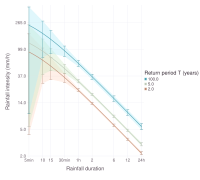

┌ Warning: The following aesthetics are mapped, but not used by any geometry:
│ shape
└ @ Gadfly C:\Users\CM\.julia\packages\Gadfly\OQ068\src\Gadfly.jl:503
┌ Warning: The following aesthetics are mapped, but not used by any geometry:
│ shape
└ @ Gadfly C:\Users\CM\.julia\packages\Gadfly\OQ068\src\Gadfly.jl:503


In [15]:
set_default_plot_size(20cm, 18cm)
pd = GeneralScaling(
    1.0,
    Covariates([Covariate("t", rcp_data[:, Symbol("RCP85")])], LinearParamComputation),
    Covariates(),
    Covariates(),
    Covariates(),
    Covariates()
)  
Σ = UncorrelatedStructure()
C = IdentityCopula
dsm = DependentScalingModel(pd, Σ, C) 
gaussian_fd = IDFCurves.fit_mle(dsm, climex_data, 1, [23, 1.0, 5.0, -.025, .835, .001], [nothing, nothing, nothing, nothing, nothing, log(delta)])
plotIDFCurves(gaussian_fd, climex_data, show_confidence_intervals=true, ribbon=true, dgev_return_levels=true, T_values=[2,5,100], year=1)

LinearParamComputation
LinearParamComputation
LinearParamComputation
LinearParamComputation
LinearParamComputation


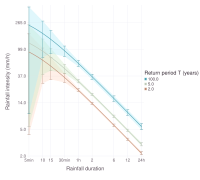

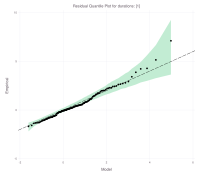

┌ Warning: The following aesthetics are mapped, but not used by any geometry:
│ shape
└ @ Gadfly C:\Users\CM\.julia\packages\Gadfly\OQ068\src\Gadfly.jl:503
┌ Warning: The following aesthetics are mapped, but not used by any geometry:
│ shape
└ @ Gadfly C:\Users\CM\.julia\packages\Gadfly\OQ068\src\Gadfly.jl:503


DependentScalingModel{GeneralScaling{Real, IDFCurves.paramfun}, UncorrelatedStructure, IdentityCopula}(GeneralScaling{Real, IDFCurves.paramfun}(d₀ = 1, μ₀ = [20.0512, 0.7455], σ₀ = [6.9737], ξ = [0.0881], α = [0.7512], δ = [0.0826])
, UncorrelatedStructure())
kda.csv - BIC: 3497.080169030692
0.16303105252228842
LinearParamComputation
LinearParamComputation
LinearParamComputation
LinearParamComputation
LinearParamComputation
LinearParamComputation
LinearParamComputation
LinearParamComputation
LinearParamComputation
LinearParamComputation
LinearParamComputation
LinearParamComputation
LinearParamComputation
LinearParamComputation
LinearParamComputation
DependentScalingModel{GeneralScaling{Real, IDFCurves.paramfun}, UncorrelatedStructure, IdentityCopula}(GeneralScaling{Real, IDFCurves.paramfun}(d₀ = 1, μ₀ = [23.0755, 1.2207], σ₀ = [6.9021], ξ = [0.0397], α = [0.861], δ = [0.4089])
, UncorrelatedStructure())
kda.csv - BIC: 3393.9645883242697


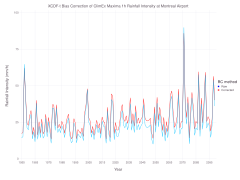

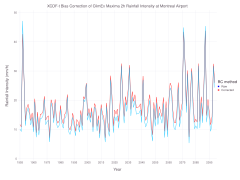

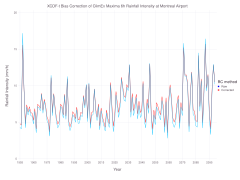

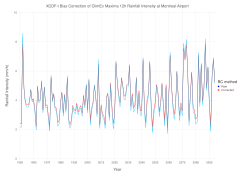

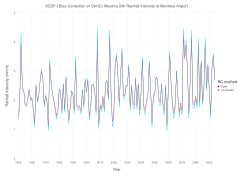

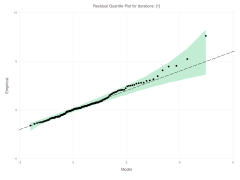

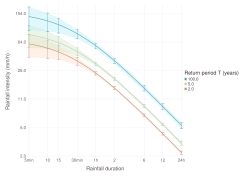

┌ Warning: The following aesthetics are mapped, but not used by any geometry:
│ shape
└ @ Gadfly C:\Users\CM\.julia\packages\Gadfly\OQ068\src\Gadfly.jl:503
┌ Warning: The following aesthetics are mapped, but not used by any geometry:
│ shape
└ @ Gadfly C:\Users\CM\.julia\packages\Gadfly\OQ068\src\Gadfly.jl:503


In [20]:
counter = 0
for (member_id, member_data) in df_annual_maxima
    pd = GeneralScaling(
        1.0,
        Covariates([Covariate("t", rcp_data[:, Symbol("RCP85")])], LinearParamComputation),
        Covariates(),
        Covariates(),
        Covariates(),
        Covariates()
    )  
    Σ = UncorrelatedStructure()
    C = IdentityCopula
    dsm = DependentScalingModel(pd, Σ, C) 

    gaussian_fd = IDFCurves.fit_mle(dsm, climex_data, 1, [23, 1.0, 5.0, -.025, .835, .001], [nothing, nothing, nothing, nothing, nothing, log(delta)])

    idf = plotIDFCurves(gaussian_fd, climex_data, show_confidence_intervals=true, ribbon=true, dgev_return_levels=true, T_values=[2,5,100], year=1)

    display(idf)
    
    qqplot_dgev = IDFCurves.qqplot_std_data(gaussian_fd, climex_data, [1])
    
    display(qqplot_dgev)
    
    println(gaussian_fd)
    println("$member_id - BIC: ", IDFCurves.bic(gaussian_fd, climex_data))

    H = IDFCurves.hessian(gaussian_fd, climex_data)
    v = IDFCurves.quantilevar(gaussian_fd, climex_data, 1, 0.05, H, 2099-2021)
    println(v)

    ## BC method

    pqm_climex_data = generate_pqm(data, member_data, true)
    
    durations = [1, 2, 6, 12, 24]
    tags = names(member_data)[7:11]
    duration_dict = Dict(zip(tags, durations))
    pqm_idf_data = IDFdata(pqm_climex_data, "Year", duration_dict)
    
    pd = GeneralScaling(
        1.0,
        Covariates([Covariate("t", rcp_data[:, Symbol("RCP85")])], LinearParamComputation),
        Covariates(),
        Covariates(),
        Covariates(),
        Covariates()
    )  
    Σ = UncorrelatedStructure()
    C = IdentityCopula
    dsm = DependentScalingModel(pd, Σ, C) 

    gaussian_fd = IDFCurves.fit_mle(dsm, pqm_idf_data, 1, [23, 1.0, 5.0, -.025, .835, .001], [nothing, nothing, nothing, nothing, nothing, nothing])
    println(gaussian_fd)
    println("$member_id - BIC: ", IDFCurves.bic(gaussian_fd, pqm_idf_data))

    qqplot_dgev = IDFCurves.qqplot_std_data(gaussian_fd, pqm_idf_data, [1])

    display(qqplot_dgev)

    idf = plotIDFCurves(gaussian_fd, pqm_idf_data, show_confidence_intervals=true, ribbon=true, dgev_return_levels=true, T_values=[2,5,100], year=1)

    display(idf)

    # get variance du to BC method per duration. (new model var - old model var, take abs value)
    # H = IDFCurves.hessian(gaussian_fd, pqm_idf_data)
    # v = IDFCurves.quantilevar(gaussian_fd, pqm_idf_data, 1, 0.05, H, 2099-2021)
    # println(v)
    counter += 1
    if counter == 1
        break
    end
end